In [2]:
import pandas as pd
import numpy as np
import geopandas as gpd
import pandas_gbq

import requests
from bs4 import BeautifulSoup
import json
import lxml

from datetime import datetime, timedelta
import time

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.colors import LinearSegmentedColormap
import seaborn as sns
import plotly.express as px
import folium
from folium.plugins import MarkerCluster, HeatMap
import missingno as msno

from shapely.geometry import Point, Polygon, MultiPolygon, shape
from shapely import wkt

import googlemaps
from google.cloud import bigquery
from google.oauth2 import service_account

import os
import glob
import warnings

DATA_PATH = "data/"
KEY_PATH = "config/"

key_path = KEY_PATH + "fireforest-team-ys-2023.json"
servicekey_path = KEY_PATH + "serviceKey.json"

warnings.filterwarnings("ignore")

In [3]:
def get_service_key(servicekey_path, key_name):
    """
    주어진 서비스 키 파일에서 지정된 키 이름에 해당하는 서비스 키를 반환합니다.

    Args:
        servicekey_path (str): 서비스 키 파일의 경로.
        key_name (str): 반환할 서비스 키의 이름.

    Returns:
        str or None: 지정된 키 이름에 해당하는 서비스 키. 키를 찾을 수 없는 경우 None을 반환합니다.
    """
    
    with open(servicekey_path) as f:
        data = json.load(f)
        service_key = data.get(key_name)
    return service_key

In [4]:
def get_dataframe_from_bigquery(dataset_id, table_id, key_path):
    """
    주어진 BigQuery 테이블에서 데이터를 조회하여 DataFrame으로 반환합니다.

    Args:
        dataset_id (str): 대상 데이터셋의 ID.
        table_id (str): 대상 테이블의 ID.
        key_path (str): 서비스 계정 키 파일의 경로.

    Returns:
        pandas.DataFrame: 조회된 데이터를 담은 DataFrame 객체.
    """

    # Credentials 객체 생성
    credentials = service_account.Credentials.from_service_account_file(key_path)

    # BigQuery 클라이언트 생성
    client = bigquery.Client(credentials=credentials, project=credentials.project_id)

    # 테이블 레퍼런스 생성
    table_ref = client.dataset(dataset_id).table(table_id)

    # 테이블 데이터를 DataFrame으로 변환
    df = client.list_rows(table_ref).to_dataframe()

    return df

In [5]:
def get_geodataframe_from_bigquery(dataset_id, table_id, key_path):
    """
    주어진 BigQuery 테이블에서 데이터를 조회하여 Geopandas GeoDataFrame으로 반환합니다.

    Args:
        dataset_id (str): 대상 데이터셋의 ID.
        table_id (str): 대상 테이블의 ID.
        key_path (str): 서비스 계정 키 파일의 경로.

    Returns:
        geopandas.GeoDataFrame: 조회된 데이터를 담은 Geopandas GeoDataFrame 객체.
    """
    
    # Credentials 객체 생성
    credentials = service_account.Credentials.from_service_account_file(key_path)

    # 빅쿼리 클라이언트 객체 생성
    client = bigquery.Client(credentials=credentials)

    # 쿼리 작성
    query = f"SELECT * FROM `{dataset_id}.{table_id}`"

    # 쿼리 실행
    df = client.query(query).to_dataframe()
    
    # 'geometry' 열의 문자열을 다각형 객체로 변환
    df['geometry'] = df['geometry'].apply(wkt.loads)

    # GeoDataFrame으로 변환
    gdf = gpd.GeoDataFrame(df, geometry='geometry')
    gdf.crs = "EPSG:4326"

    return gdf

In [6]:
def visualize_missing_data(dataframe):
    """
    데이터셋의 결측치를 시각화합니다.

    Args:
        dataframe (pandas.DataFrame): 결측치를 시각화할 데이터프레임.

    Returns:
        None
    """
    plt.style.use('ggplot')
    plt.rcParams['figure.figsize'] = (10, 5)
    plt.rcParams['font.size'] = 12
    plt.rcParams['font.family'] = 'Malgun Gothic'
    plt.rcParams['axes.unicode_minus'] = False

    plt.figure(figsize=(10, 5))
    msno.matrix(dataframe, color=(1.0, 0.5, 0.0), sparkline=True)
    plt.xticks(rotation=45)

    column_names = dataframe.columns
    plt.xlabel('열 이름')
    plt.ylabel('결측치 개수')
    plt.title('데이터셋의 결측치 시각화')

    plt.xticks(range(len(column_names)), column_names, rotation=90)

    plt.show()

In [7]:
def create_choropleth_map(dataframe, geometry_column, value_column, legend_name):
    """
    GeoDataFrame을 기반으로 Choropleth 맵을 생성합니다.

    Args:
        dataframe (geopandas.GeoDataFrame): Choropleth 맵을 생성할 GeoDataFrame.
        geometry_column (str): 지오메트리 정보를 포함하는 열의 이름.
        value_column (str): 색상으로 표현할 값을 포함하는 열의 이름.
        legend_name (str): 범례의 이름.

    Returns:
        folium.Map: 생성된 Choropleth 맵 객체.
    """
    
    # 표현할 좌표계 설정
    dataframe.crs = "EPSG:4326"

    # 지도 생성
    map = folium.Map(location=[37.5, 128], zoom_start=7)

    # 테두리 선 스타일 함수
    def style_function(feature):
        return {
            'fillColor': 'YlOrRd',
            'fillOpacity': 0.7,
            'color': 'black',  # 테두리 선 색상
            'weight': 1,       # 테두리 선 두께
            'dashArray': '5, 5' # 테두리 선 스타일
        }

    # Choropleth 맵 생성
    folium.Choropleth(
        geo_data=dataframe,
        data=dataframe,
        columns=[geometry_column, value_column],
        key_on='feature.properties.' + geometry_column,
        fill_color='YlOrRd',
        fill_opacity=0.7,
        line_opacity=0.4,
        line_color='black',  # 폴리곤 테두리 선 색상
        line_weight=3,       # 폴리곤 테두리 선 두께
        line_dash='5, 5',    # 폴리곤 테두리 선 스타일
        legend_name=legend_name,
        highlight=True,
        highlight_function=lambda x: {'weight': 3}  # 하이라이트 스타일
    ).add_to(map)

    return map

In [8]:
def visualize_forestfire_by_region(dataframe, region_column, value_column, cmap_name, title):
    """
    지역별 특정 값에 따른 시각화를 수행합니다.

    Args:
        dataframe (pandas.DataFrame): 지역별 값 데이터가 포함된 DataFrame.
        region_column (str): 지역 정보가 포함된 열의 이름.
        value_column (str): 시각화할 값이 포함된 열의 이름.
        cmap_name (str): 색상 맵 이름.
        title (str): 시각화 제목.

    Returns:
        None
    """
    dataframe.crs = "EPSG:4326"

    # 색상 설정
    cmap = LinearSegmentedColormap.from_list(cmap_name, ['green', 'orange', 'darkred'])

    # 지도 그리기
    fig, ax = plt.subplots(figsize=(10, 12))
    dataframe.plot(column=value_column, cmap=cmap, linewidth=0.8, ax=ax, edgecolor='0.8')

    # 범례 설정
    sm = plt.cm.ScalarMappable(cmap=cmap)
    sm.set_array([])
    cbar = plt.colorbar(sm, **{'orientation': 'vertical', 'shrink': 0.6})  # cbar_kwargs를 사용하여 높이 조절

    # 축 제거
    ax.axis('off')

    # 제목 설정
    plt.title(title)

    # 시각화 출력
    plt.show()

In [9]:
def plot_boxplot(data_frames, column_name, labels, colors, title, ylabel):
    """
    여러 데이터프레임의 특정 컬럼에 대한 boxplot을 그리는 함수입니다.

    Args:
        data_frames (list): 데이터프레임들의 리스트
        column_name (str): boxplot에 사용할 컬럼의 이름
        labels (list): 각 boxplot에 대한 레이블 리스트
        colors (list): 각 boxplot의 색상 리스트
        title (str): 그래프의 제목
        ylabel (str): y축 레이블

    Returns:
        None
    """

    plt.style.use('ggplot')
    plt.rcParams['figure.figsize'] = (10, 5)
    plt.rcParams['font.size'] = 12
    plt.rcParams['font.family'] = 'Malgun Gothic'
    plt.rcParams['axes.unicode_minus'] = False

    fig, ax = plt.subplots()

    box_width = 1.5
    median_color = 'red'

    for i, df in enumerate(data_frames):
        data = [df[column_name]]
        box = ax.boxplot(data, patch_artist=True, positions=[i*4+2], widths=box_width,
                         boxprops={'linewidth': 1.7, 'edgecolor': 'black'},
                         whiskerprops={'linewidth': 1.7})

        for patch, color in zip(box["boxes"], colors):
            patch.set_facecolor(color)

        for median in box["medians"]:
            median.set(color=median_color)

    ax.set_xticks([i*4+2 for i in range(len(data_frames))])

    if pd.Series(title).str.contains("기온").any():
        yticks = np.arange(-30, 50, 10)
    elif pd.Series(title).str.contains("습도").any():
        yticks = np.arange(10, 110, 10)
    elif pd.Series(title).str.contains("풍속").any():
        yticks = np.arange(0, 35, 5)
    else:
        yticks = None

    if yticks is not None:
        ax.set_yticks(yticks)

    legend_patches = [mpatches.Patch(color=color, label=label) for color, label in zip(colors, labels)]
    ax.legend(handles=legend_patches, loc='lower center', bbox_to_anchor=(0.5, -0.2),
              fontsize=8.5, ncol=len(data_frames))

    ax.set_xticklabels(["지역 " + str(i+1) for i in range(len(data_frames))])
    ax.set_title(title, fontweight='bold')
    ax.set_ylabel(ylabel)
    plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9)

    plt.show()

# EDA - 결측치 확인
- 결측치 확인의 경우 전처리 과정상 한 번에 처리 된 경우 PPT 와 조금 다를 수 있음

### RAW_DATA

In [10]:
# BigQuery 에 RAW_DATA Load

weather_stations = get_dataframe_from_bigquery("RAW_DATA", "weather_stations", key_path).sort_values(["stnId"])
weather_days = get_dataframe_from_bigquery("RAW_DATA", "weather_days", key_path).sort_values(["stnId", "tm"])
forestfire_occurs = get_dataframe_from_bigquery("RAW_DATA", "forestfire_occurs", key_path).sort_values(["objt_id", "occu_date"])
forestfire_occurs_add = get_dataframe_from_bigquery("RAW_DATA", "forestfire_occurs_add", key_path).sort_values(["objt_id", "occu_date"])
gangwon_code = get_dataframe_from_bigquery("RAW_DATA", "gangwon_code", key_path).sort_values(["code"])

gangwon_SGG = get_geodataframe_from_bigquery("RAW_DATA", "gangwon_SGG", key_path).sort_values(["ADM_SECT_C", "SGG_NM"])
gangwon_UMD = get_geodataframe_from_bigquery("RAW_DATA", "gangwon_UMD", key_path).sort_values(["EMD_CD"])

<Figure size 1000x500 with 0 Axes>

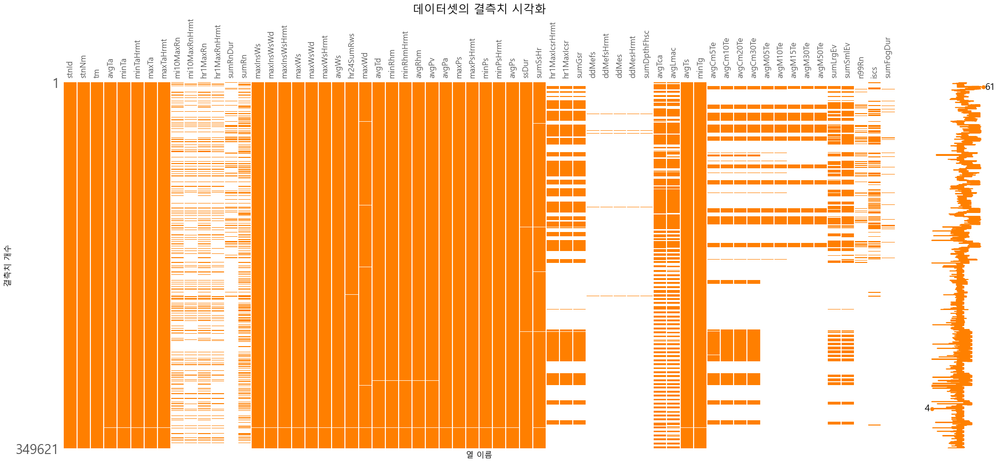

In [11]:
visualize_missing_data(weather_days)

<Figure size 1000x500 with 0 Axes>

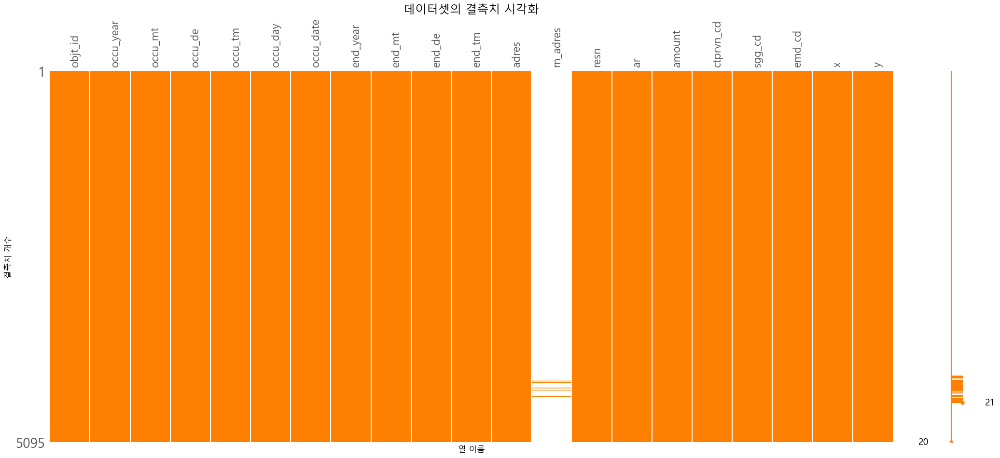

In [12]:
visualize_missing_data(forestfire_occurs)

### PREPROCESSING_DATA

In [13]:
# BigQuery 에 PREPROCESSING_DATA Load

weather_stations = get_dataframe_from_bigquery("PREPROCESSING_DATA", "weather_stations", key_path).sort_values(["stnId"])
weather_days = get_dataframe_from_bigquery("PREPROCESSING_DATA", "weather_days", key_path).sort_values(["stnId", "tm"])
forestfire_occurs = get_dataframe_from_bigquery("PREPROCESSING_DATA", "forestfire_occurs", key_path).sort_values(["objt_id", "occu_date"])
gangwon_regions = get_geodataframe_from_bigquery("PREPROCESSING_DATA", "gangwon_regions", key_path)

<Figure size 1000x500 with 0 Axes>

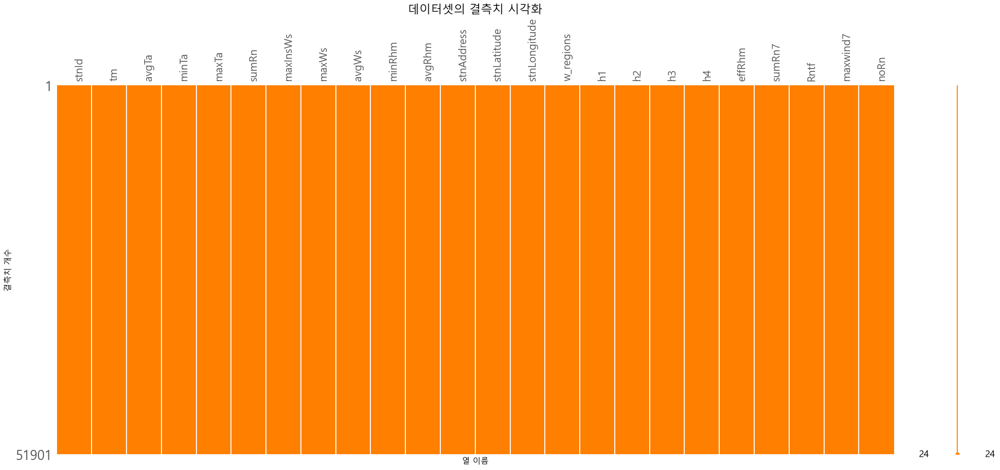

In [14]:
visualize_missing_data(weather_days)

<Figure size 1000x500 with 0 Axes>

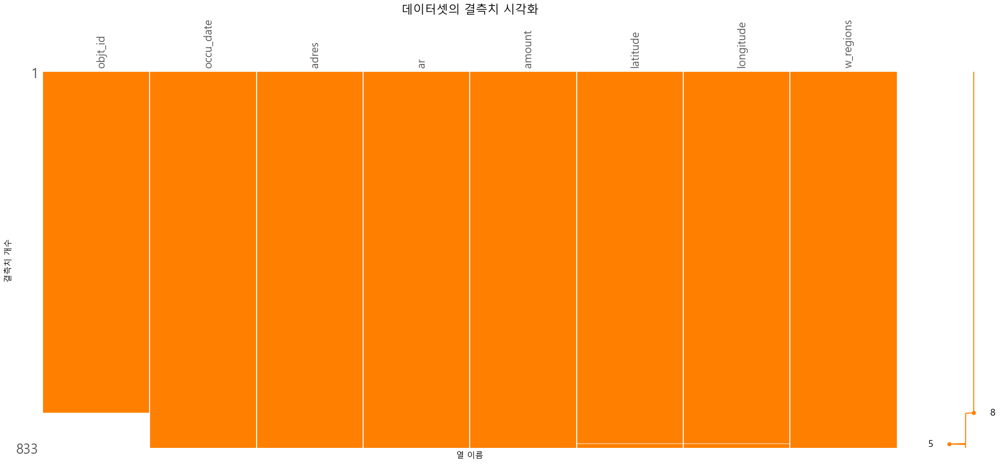

In [15]:
visualize_missing_data(forestfire_occurs)

In [16]:
forestfire_occurs

,objt_id,occu_date,adres,ar,amount,latitude,longitude,w_regions
803,1017,2014-04-16,강원도 춘천시 동면 만천리 산31-15,0.09,0,37.875054,127.788101,강원중부내륙
664,1019,2014-04-17,강원도 춘천시 동면 만천리 산30,0.03,0,37.874114,127.788125,강원중부내륙
156,102,2011-03-14,강원도 영월군 영월읍 정양리 산80,0.1,64,37.150817,128.520017,강원남부산지
311,1023,2014-04-20,강원도 홍천군 서면 동막리 산110-1,0.2,0,37.659113,127.561334,강원중부내륙
160,1028,2014-04-21,강원도 영월군 한반도면 광전리 산57,0.1,0,37.271407,128.350243,강원남부산지
...,...,...,...,...,...,...,...,...
470,None,2022-12-04,강원도 고성군 거진 송강리 산40-8,0.9,20218,38.438462,128.388452,강원북부해안
636,None,2022-12-05,강원도 강릉시 주문진읍 향호리 산216,0.02,1732,37.898943,128.797257,강원중부해안
34,None,2022-12-14,강원도 삼척시 근덕 동막리 산526-1,5.2,141544,37.328813,129.231968,강원남부해안
369,None,2022-12-17,강원도 고성군 죽왕 구성리 산34,0.3,9936,38.326925,128.472262,강원북부해안


### ANALSIS_DATA

In [17]:
# BigQuery 에 ANALSIS_DATA Load

analsis_data = get_dataframe_from_bigquery("ANALSIS_DATA", "ANALSIS_DATA", key_path)

<Figure size 1000x500 with 0 Axes>

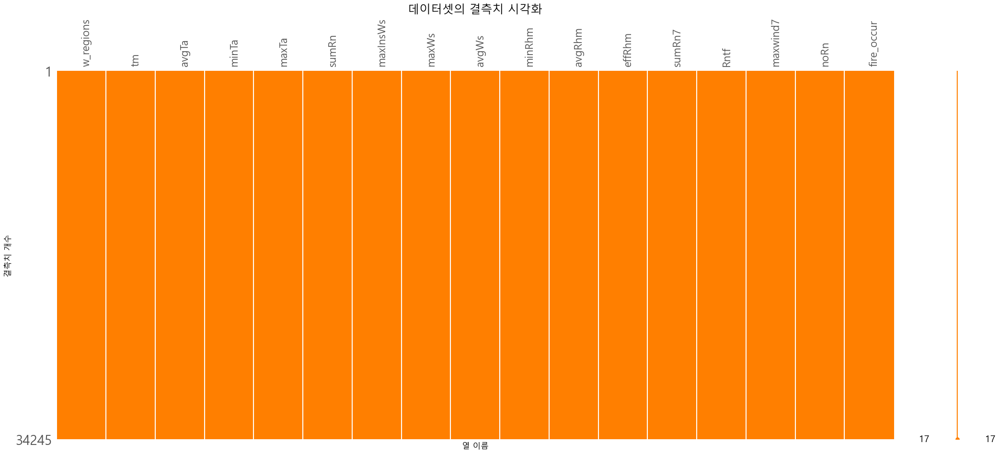

In [18]:
visualize_missing_data(analsis_data)

# EDA - 지도시각화

In [19]:
forestfire_occurs['ar'].isna().sum(), forestfire_occurs['amount'].isna().sum()

(0, 0)

#### 지도에 표현할 ar(피해범위), amount(피해금액) 의 총합

In [20]:
visual_feature = forestfire_occurs[["w_regions", "ar", "amount", "latitude", "longitude"]].groupby(["w_regions"]).agg({
    "ar": lambda x: x.astype(float).sum(),
    "amount": lambda x: x.astype(float).sum(),
    "latitude": "mean",
    "longitude": "mean"
}).reset_index()

In [21]:
visual_feature

,w_regions,ar,amount,latitude,longitude
0,강원남부내륙,36.83,1053695.0,37.402656,128.002934
1,강원남부산지,300.30,13473064.0,37.349649,128.538553
2,강원남부해안,1116.07,20529396.0,37.308603,129.118016
3,강원북부내륙,62.33,1962930.0,38.156097,127.501466
4,강원북부산지,1118.51,41380263.0,38.079994,128.115934
5,강원북부해안,1887.42,163992117.0,38.169139,128.562214
6,강원중부내륙,144.12,5787666.0,37.799513,127.823260
7,강원중부산지,3.38,94386.0,37.683954,128.550178
8,강원중부해안,5907.61,333729392.0,37.725958,128.835794


In [22]:
gangwon_regions

,w_regions,geometry
0,강원북부내륙,"MULTIPOLYGON (((127.37782 38.11781, 127.37710 ..."
1,강원중부내륙,"POLYGON ((127.69536 37.60093, 127.69434 37.601..."
2,강원남부내륙,"POLYGON ((127.92350 37.22131, 127.92710 37.220..."
3,강원북부산지,"MULTIPOLYGON (((128.02955 38.01470, 128.02878 ..."
4,강원중부산지,"POLYGON ((128.59927 37.80631, 128.59863 37.805..."
5,강원남부산지,"POLYGON ((128.49656 37.12579, 128.49655 37.125..."
6,강원북부해안,"MULTIPOLYGON (((128.24508 38.40860, 128.24513 ..."
7,강원중부해안,"MULTIPOLYGON (((128.88393 37.59272, 128.88249 ..."
8,강원남부해안,"MULTIPOLYGON (((129.09240 37.09858, 129.09235 ..."


## 지도시각화 1 : 피해건수

In [23]:
# w_regions별 value_counts 계산
region_counts = forestfire_occurs['w_regions'].value_counts().reset_index()
region_counts.columns = ['w_regions', 'Counts']

# 데이터프레임 생성
region_counts_df = pd.DataFrame({'w_regions': region_counts['w_regions'],
                                 'Fire_Counts': region_counts['Counts']})

merged_Count = gangwon_regions.merge(region_counts_df, on='w_regions', how='left')

create_choropleth_map(merged_Count, "w_regions", "Fire_Counts", "w_regions")

## 지도시각화 1 : 피해범위

In [24]:
Damage_Area = pd.DataFrame({'w_regions': visual_feature['w_regions'],
                            'DamageArea': visual_feature['ar']})

merged_Area = gangwon_regions.merge(Damage_Area, on='w_regions', how='left')

create_choropleth_map(merged_Area, "w_regions", "DamageArea", "w_regions")

## 지도시각화 1 : 피해금액

In [25]:
Damage_Amount = pd.DataFrame({'w_regions': visual_feature['w_regions'],
                              'Amount': visual_feature['amount']})

merged_Amount = gangwon_regions.merge(Damage_Amount, on='w_regions', how='left')

create_choropleth_map(merged_Amount, "w_regions", "Amount", "w_regions")

## 지도시각화 2 : 피해건수

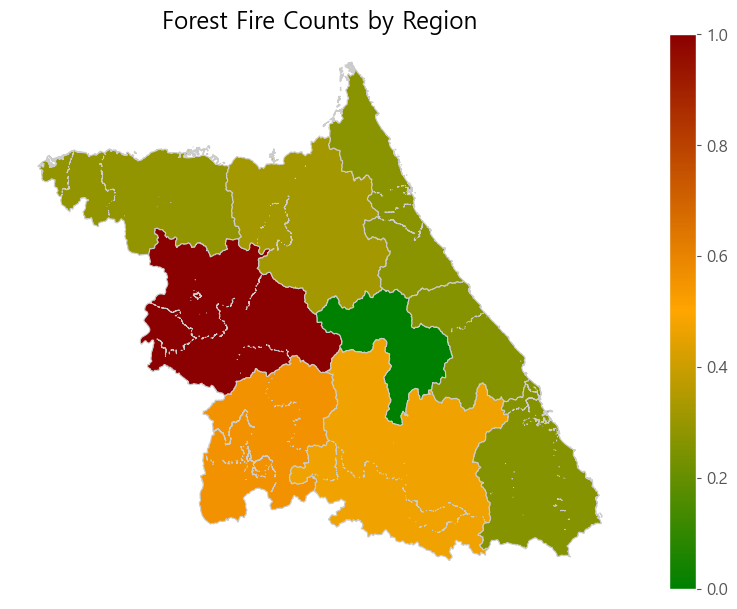

In [26]:
# w_regions별 value_counts 계산
region_counts = forestfire_occurs['w_regions'].value_counts().reset_index()
region_counts.columns = ['w_regions', 'Counts']

# 데이터프레임 생성
region_counts_df = pd.DataFrame({'w_regions': region_counts['w_regions'],
                                 'Fire_Counts': region_counts['Counts']})

merged_Count = gangwon_regions.merge(region_counts_df, on='w_regions', how='left')

visualize_forestfire_by_region(merged_Count, "w_regions", "Fire_Counts", "fire_counts_cmap", "Forest Fire Counts by Region")

## 지도시각화 2 : 피해범위

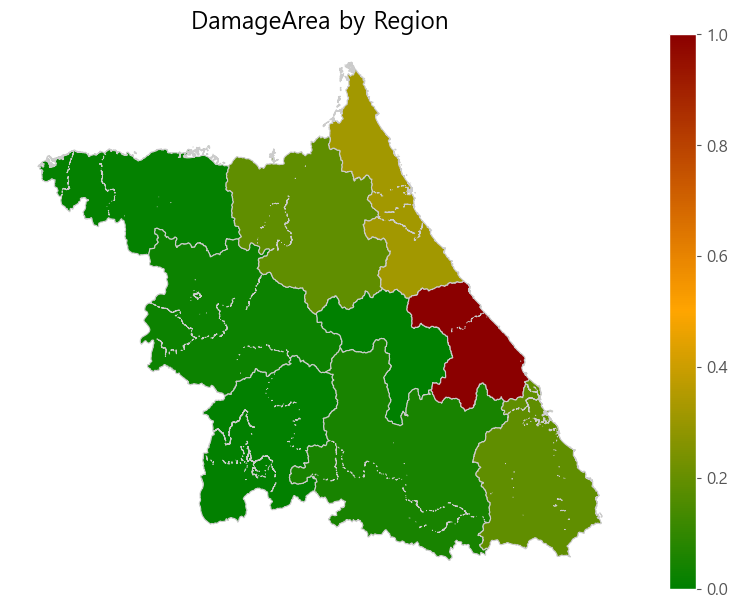

In [27]:
Damage_Area = pd.DataFrame({'w_regions': visual_feature['w_regions'],
                            'DamageArea': visual_feature['ar']})

merged_Area = gangwon_regions.merge(Damage_Area, on='w_regions', how='left')

visualize_forestfire_by_region(merged_Area, "w_regions", "DamageArea", "DamageArea_cmap", "DamageArea by Region")

## 지도시각화 2 : 피해금액

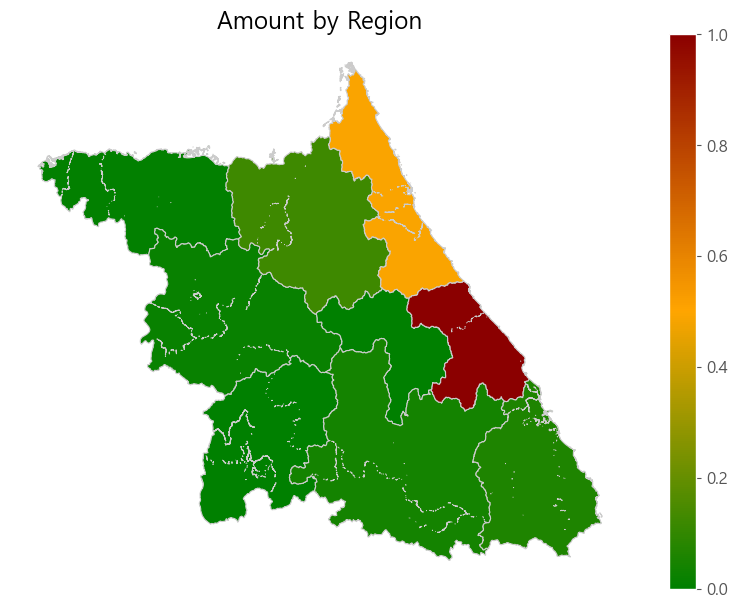

In [28]:
Damage_Amount = pd.DataFrame({'w_regions': visual_feature['w_regions'],
                              'Amount': visual_feature['amount']})

merged_Amount = gangwon_regions.merge(Damage_Amount, on='w_regions', how='left')

visualize_forestfire_by_region(merged_Amount, "w_regions", "Amount", "Amount_cmap", "Amount by Region")

## 지도시각화 3 : 산불발생위치

In [29]:
# 각 지역의 색상 설정
region_colors = {
    '강원북부내륙': 'blue',
    '강원중부내륙': 'brown',
    '강원남부내륙': 'green',
    '강원북부산지': 'orange',
    '강원중부산지': 'purple',
    '강원남부산지': 'black',
    '강원북부해안': 'gray',
    '강원중부해안': 'red',
    '강원남부해안': 'magenta'
}

# 지도 생성
map = folium.Map(location=[37.55, 128], zoom_start=8)

# 마커 그룹화
marker_cluster = MarkerCluster().add_to(map)

# 데이터프레임의 각 행을 반복하며 마커 추가
for index, row in forestfire_occurs.iterrows():
    if np.isnan(row['latitude']) or np.isnan(row['longitude']):
        continue

    popup = folium.Popup(row['adres'], max_width=300)
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=4,
        popup=popup,
        icon=folium.Icon(color='red', icon='info-sign'),
        color='red'
    ).add_to(marker_cluster)

# 각 지역을 지도에 추가
for region_name, region_data in gangwon_regions.iterrows():
    folium.GeoJson(
        region_data['geometry'],
        style_function=lambda feature, region=region_data['w_regions']: {
            'fillColor': region_colors[region],
            'color': region_colors[region]
        }
    ).add_to(map)

# 지도 표시
map

# EDA - 분석 데이터

In [30]:
data_1 = get_dataframe_from_bigquery("ANALSIS_DATA", "GangwonNorthInland", key_path).sort_values(["tm"]).reset_index(drop=True)
data_2 = get_dataframe_from_bigquery("ANALSIS_DATA", "GangwonNorthMount", key_path).sort_values(["tm"]).reset_index(drop=True)
data_3 = get_dataframe_from_bigquery("ANALSIS_DATA", "GangwonNorthCoast", key_path).sort_values(["tm"]).reset_index(drop=True)
data_4 = get_dataframe_from_bigquery("ANALSIS_DATA", "GangwonCentralInland", key_path).sort_values(["tm"]).reset_index(drop=True)
data_5 = get_dataframe_from_bigquery("ANALSIS_DATA", "GangwonCentralMount", key_path).sort_values(["tm"]).reset_index(drop=True)
data_6 = get_dataframe_from_bigquery("ANALSIS_DATA", "GangwonCentralCoast", key_path).sort_values(["tm"]).reset_index(drop=True)
data_7 = get_dataframe_from_bigquery("ANALSIS_DATA", "GangwonSouthInland", key_path).sort_values(["tm"]).reset_index(drop=True)
data_8 = get_dataframe_from_bigquery("ANALSIS_DATA", "GangwonSouthMount", key_path).sort_values(["tm"]).reset_index(drop=True)
data_9 = get_dataframe_from_bigquery("ANALSIS_DATA", "GangwonSouthInland", key_path).sort_values(["tm"]).reset_index(drop=True)

data_1 = data_1[data_1['tm'] < '2023-01-01']
data_2 = data_2[data_2['tm'] < '2023-01-01']
data_3 = data_3[data_3['tm'] < '2023-01-01']
data_4 = data_4[data_4['tm'] < '2023-01-01']
data_5 = data_5[data_5['tm'] < '2023-01-01']
data_6 = data_6[data_6['tm'] < '2023-01-01']
data_7 = data_7[data_7['tm'] < '2023-01-01']
data_8 = data_8[data_8['tm'] < '2023-01-01']
data_9 = data_9[data_9['tm'] < '2023-01-01']

data_frames = [data_1, data_2, data_3, data_4, data_5, data_6, data_7, data_8, data_9]

#### 기온 (평균기온, 최고기온, 최저기온)

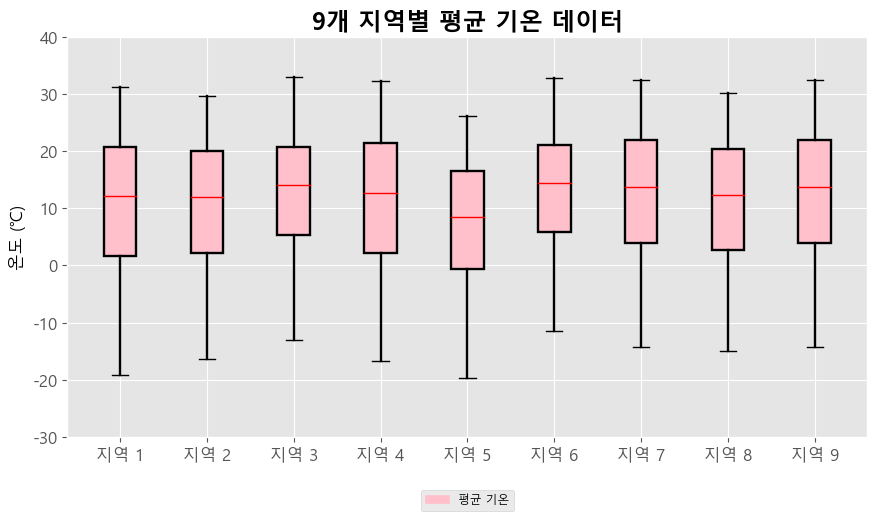

In [31]:
# 9개 지역별 평균 기온 데이터

column_name = "avgTa"
labels = ['평균 기온']
colors = ["pink"]
title = '9개 지역별 평균 기온 데이터'
ylabel = '온도 (℃)'

plot_boxplot(data_frames, column_name, labels, colors, title, ylabel)

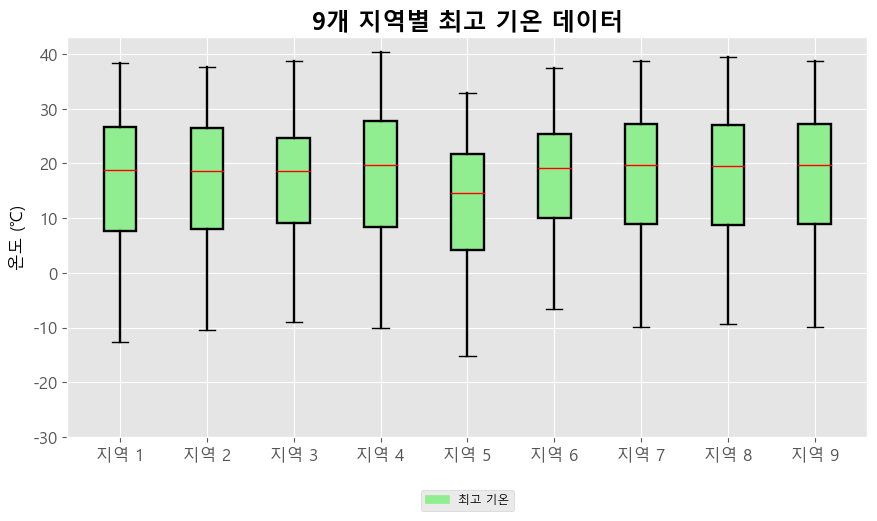

In [32]:
# 9개 지역별 최고 기온 데이터

column_name = "maxTa"
labels = ['최고 기온']
colors = ["lightgreen"]
title = '9개 지역별 최고 기온 데이터'
ylabel = '온도 (℃)'

plot_boxplot(data_frames, column_name, labels, colors, title, ylabel)

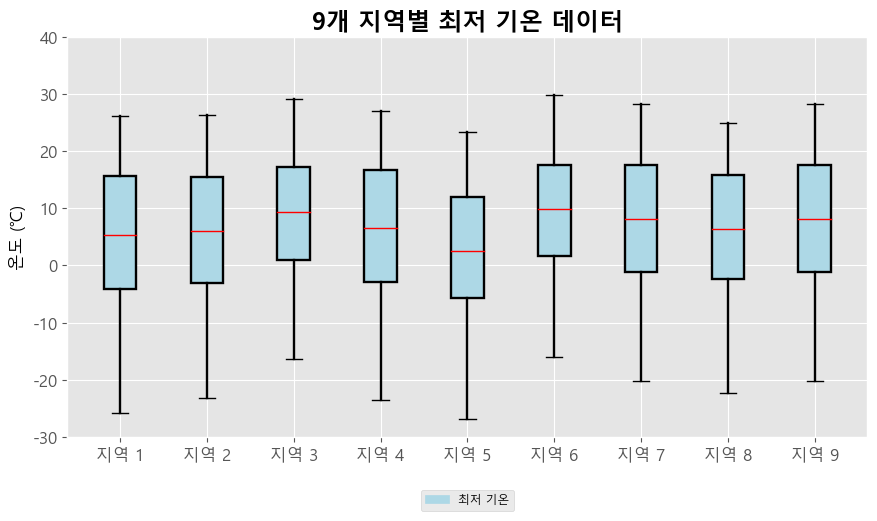

In [33]:
# 9개 지역별 최저 기온 데이터

column_name = "minTa"
labels = ['최저 기온']
colors = ["lightblue"]
title = '9개 지역별 최저 기온 데이터'
ylabel = '온도 (℃)'

plot_boxplot(data_frames, column_name, labels, colors, title, ylabel)

#### 습도 (최소 상대습도, 평균 상대습도, 실효습도)

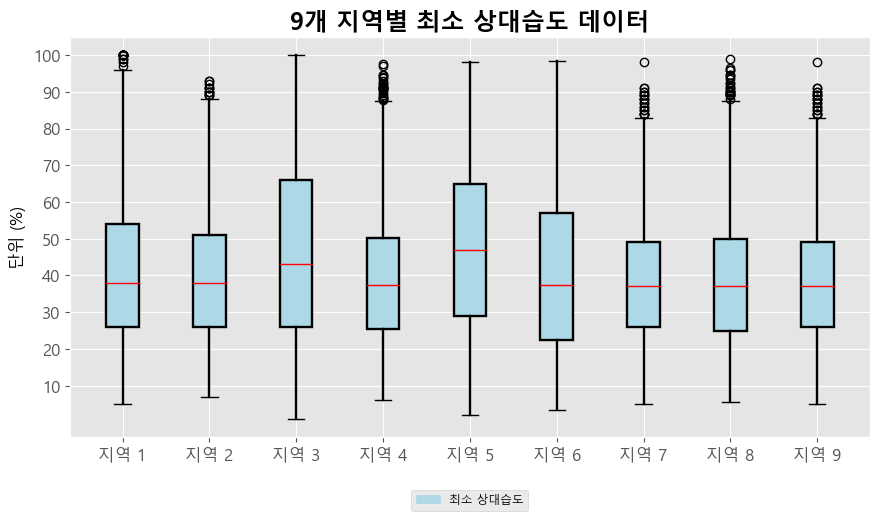

In [34]:
# 9개 지역별 최소 상대습도 데이터 

column_name = "minRhm"
labels = ['최소 상대습도']
colors = ["lightblue"]
title = '9개 지역별 최소 상대습도 데이터'
ylabel = '단위 (%)'

plot_boxplot(data_frames, column_name, labels, colors, title, ylabel)

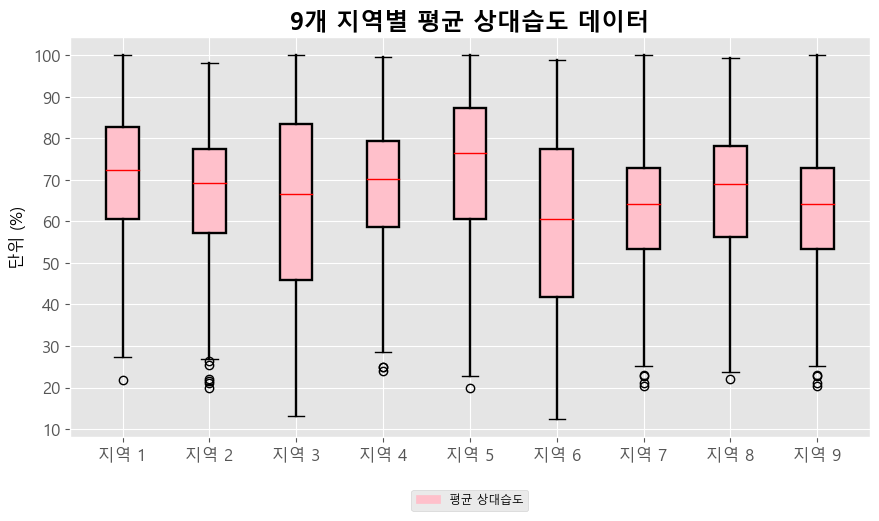

In [35]:
# 9개 지역별 평균 상대습도 데이터 

column_name = "avgRhm"
labels = ['평균 상대습도']
colors = ["pink"]
title = '9개 지역별 평균 상대습도 데이터'
ylabel = '단위 (%)'

plot_boxplot(data_frames, column_name, labels, colors, title, ylabel)

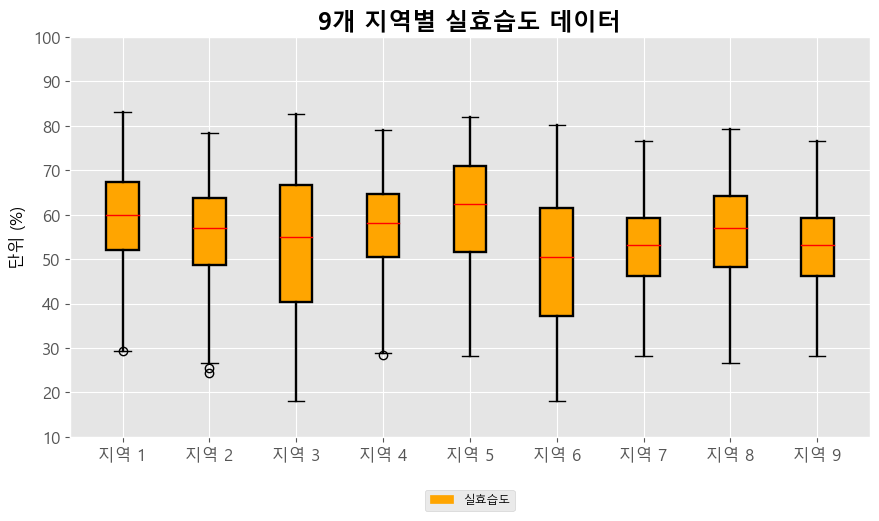

In [36]:
# 9개 지역별 최고 기온 데이터

column_name = "effRhm"
labels = ['실효습도']
colors = ["orange"]
title = '9개 지역별 실효습도 데이터'
ylabel = '단위 (%)'

plot_boxplot(data_frames, column_name, labels, colors, title, ylabel)

#### 풍속 (평균풍속, 최대순간풍속, 최대풍속, 7일간 최대풍속)

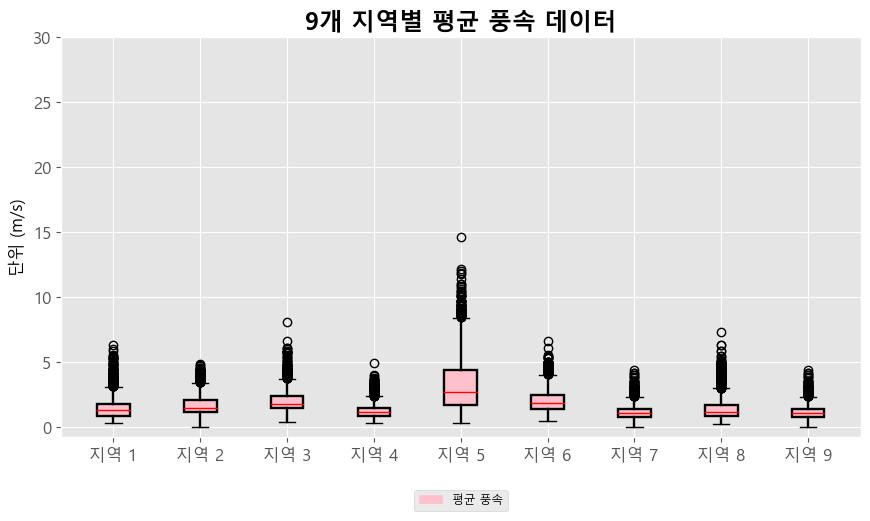

In [37]:
# 9개 지역별 평균 풍속 데이터 

column_name = "avgWs"
labels = ['평균 풍속']
colors = ["pink"]
title = '9개 지역별 평균 풍속 데이터'
ylabel = '단위 (m/s)'

plot_boxplot(data_frames, column_name, labels, colors, title, ylabel)

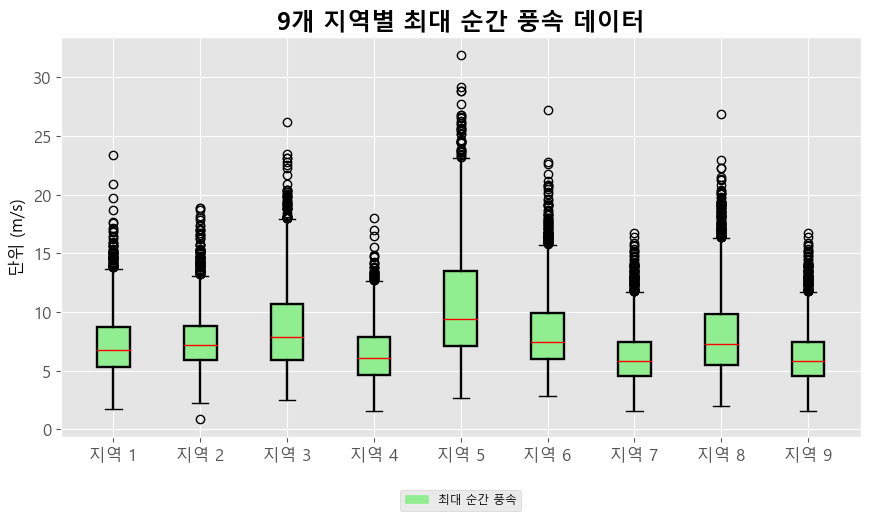

In [38]:
# 9개 지역별 최대 순간 풍속 데이터

column_name = "maxInsWs"
labels = ['최대 순간 풍속']
colors = ["lightgreen"]
title = '9개 지역별 최대 순간 풍속 데이터'
ylabel = '단위 (m/s)'

plot_boxplot(data_frames, column_name, labels, colors, title, ylabel)

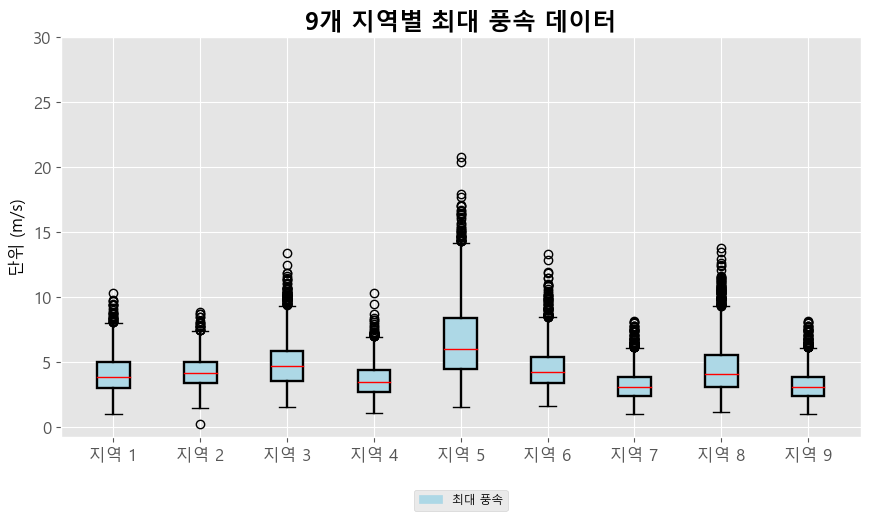

In [39]:
# 9개 지역별 최대 풍속 데이터 

column_name = "maxWs"
labels = ['최대 풍속']
colors = ["lightblue"]
title = '9개 지역별 최대 풍속 데이터'
ylabel = '단위 (m/s)'

plot_boxplot(data_frames, column_name, labels, colors, title, ylabel)

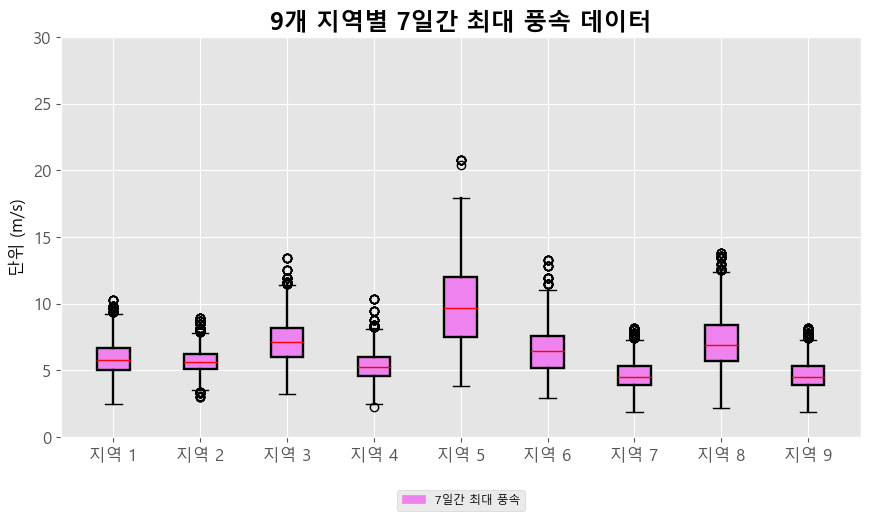

In [40]:
# 9개 지역별 7일간 최대 풍속 데이터 

column_name = "maxwind7"
labels = ['7일간 최대 풍속']
colors = ["violet"]
title = '9개 지역별 7일간 최대 풍속 데이터'
ylabel = '단위 (m/s)'

plot_boxplot(data_frames, column_name, labels, colors, title, ylabel)

#### 강수

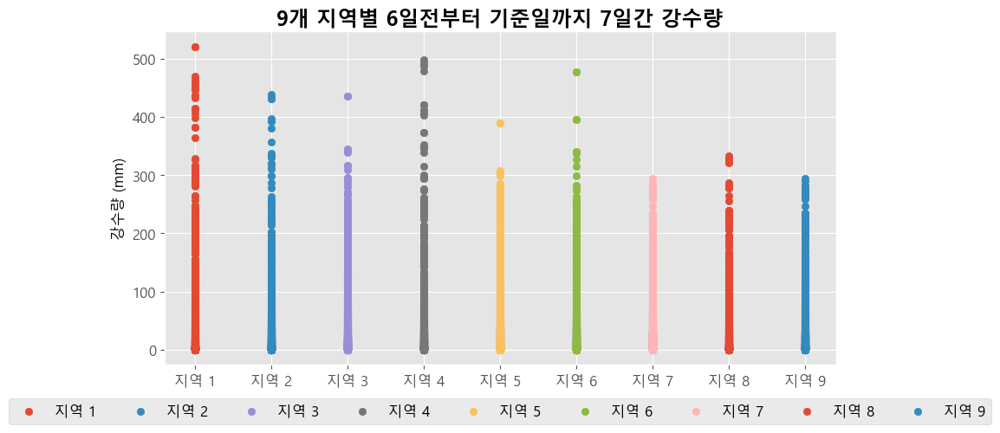

In [41]:
# 9개 지역별 6일전부터 기준일까지 7일간 강수량 데이터 

rainfall_data = [
    data_1["sumRn7"],
    data_2["sumRn7"],
    data_3["sumRn7"],
    data_4["sumRn7"],
    data_5["sumRn7"],
    data_6["sumRn7"],
    data_7["sumRn7"],
    data_8["sumRn7"],
    data_9["sumRn7"],
]

regions = ["지역 {}".format(i+1) for i in range(len(rainfall_data))]

for i in range(len(rainfall_data)):
    plt.scatter([i+1] * len(rainfall_data[i]), rainfall_data[i], label=regions[i])

plt.title("9개 지역별 6일전부터 기준일까지 7일간 강수량", fontweight="bold")
plt.ylabel("강수량 (mm)")
plt.xticks(range(1, len(regions)+1), regions)

plt.legend(ncol=len(rainfall_data), loc='lower center', bbox_to_anchor=(0.5, -0.2))

plt.show()

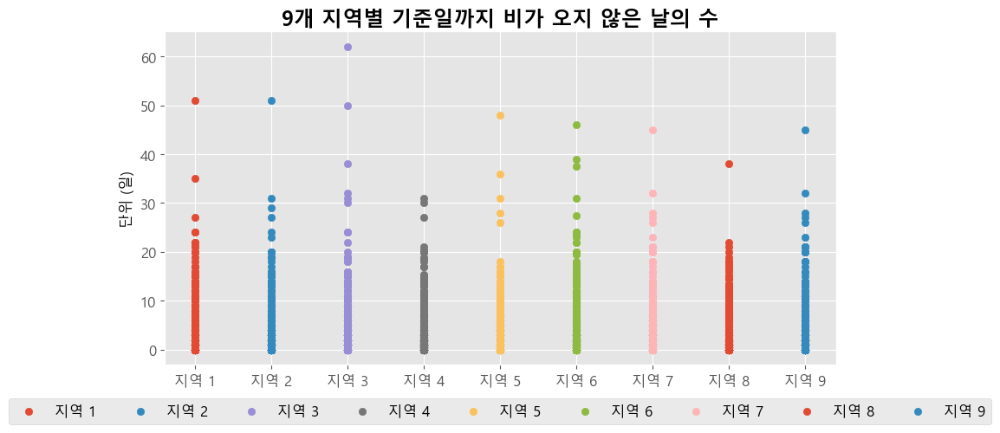

In [42]:
# 9개 지역별 기준일까지 비가 오지 않은 날의 수

rainfall_data = [
    data_1["noRn"],
    data_2["noRn"],
    data_3["noRn"],
    data_4["noRn"],
    data_5["noRn"],
    data_6["noRn"],
    data_7["noRn"],
    data_8["noRn"],
    data_9["noRn"],
]

regions = ["지역 {}".format(i+1) for i in range(len(rainfall_data))]

for i in range(len(rainfall_data)):
    plt.scatter([i+1] * len(rainfall_data[i]), rainfall_data[i], label=regions[i])

plt.title("9개 지역별 기준일까지 비가 오지 않은 날의 수", fontweight="bold")
plt.ylabel("단위 (일)")
plt.xticks(range(1, len(regions)+1), regions)

plt.legend(ncol=len(rainfall_data), loc='lower center', bbox_to_anchor=(0.5, -0.2))

plt.show()

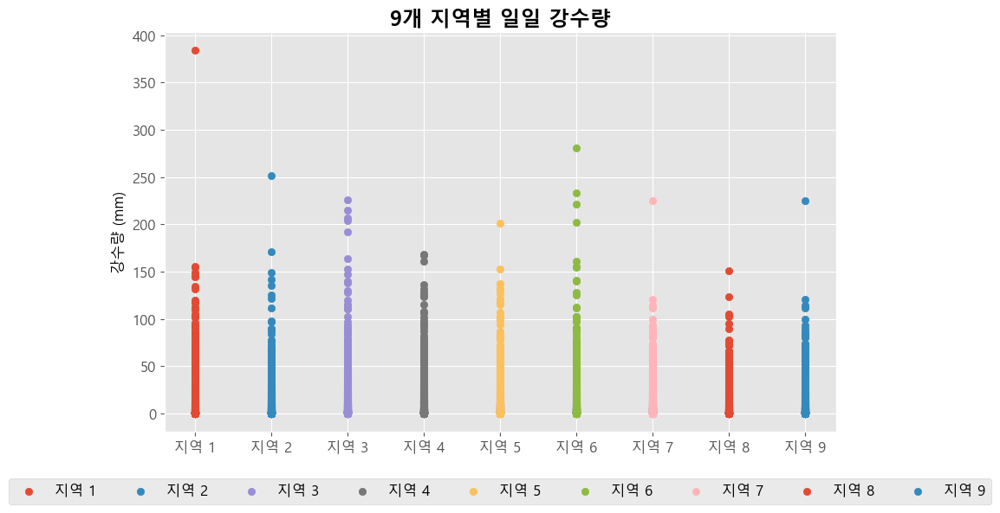

In [43]:
# 9개 지역별 일일 강수량

rainfall_data = [
    data_1["sumRn"],
    data_2["sumRn"],
    data_3["sumRn"],
    data_4["sumRn"],
    data_5["sumRn"],
    data_6["sumRn"],
    data_7["sumRn"],
    data_8["sumRn"],
    data_9["sumRn"],
]

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
for i in range(len(rainfall_data)):
    plt.scatter([i+1] * len(rainfall_data[i]), rainfall_data[i], label="지역 {}".format(i+1))
plt.title("9개 지역별 일일 강수량", fontweight="bold")
plt.ylabel("강수량 (mm)")
plt.xticks(range(1, len(rainfall_data)+1), ["지역 {}".format(i+1) for i in range(len(rainfall_data))])
plt.legend(ncol=len(rainfall_data), loc='lower center', bbox_to_anchor=(0.5, -0.2))
plt.show()

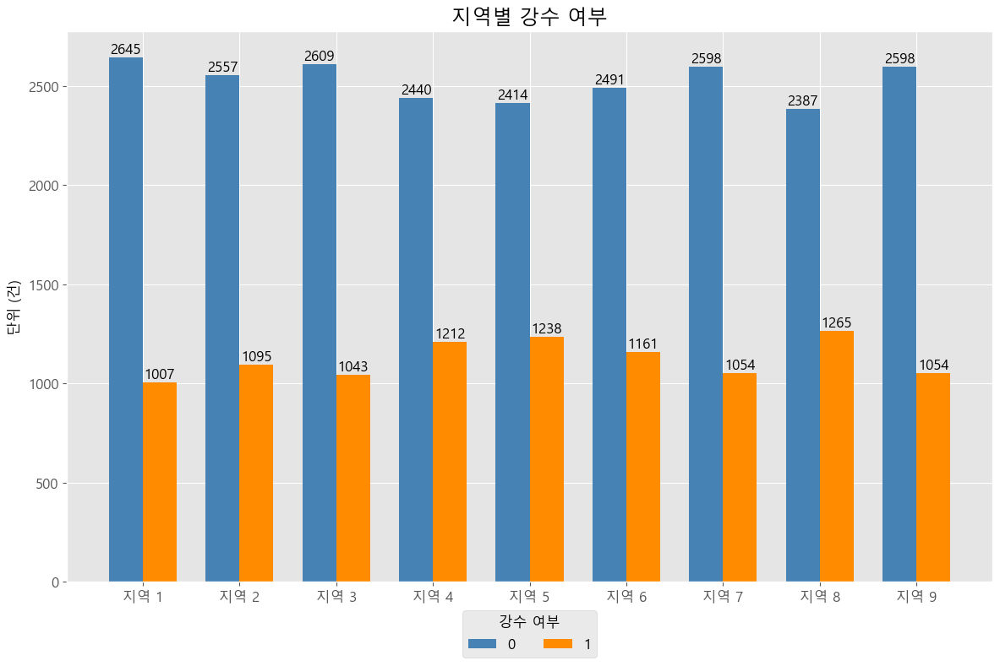

In [44]:
# 지역별 강수 여부

data_frames = [data_1, data_2, data_3, data_4, data_5, data_6, data_7, data_8, data_9]
labels = ['지역 1', '지역 2', '지역 3', '지역 4', '지역 5', '지역 6', '지역 7', '지역 8', '지역 9']

plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 12
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] = False

fig, ax = plt.subplots()

width = 0.35
x = range(len(labels))
colors = ['steelblue', 'darkorange']

legend_labels = ['0', '1']

for i, df in enumerate(data_frames):
    region = labels[i]
    counts = df['Rntf'].value_counts()

    ax.bar(x[i] - width/2, counts[0], width, label=legend_labels[0], color=colors[0])
    ax.bar(x[i] + width/2, counts[1], width, label=legend_labels[1], color=colors[1])

    for j, count in enumerate(counts):
        ax.text(x[i] + width*(j-0.5), count+2, str(count), ha='center', va='bottom')

ax.set_xticks(x)
ax.set_xticklabels(labels)

ax.set_ylabel('단위 (건)')
ax.set_title('지역별 강수 여부')


legend = ax.legend(handles=[ax.patches[0], ax.patches[len(labels)]], labels=legend_labels, title='강수 여부', loc='lower center', ncol=2)


legend.set_bbox_to_anchor((0.5, -0.15)) 
legend._legend_box.align = "center"  

plt.tight_layout()
plt.show()

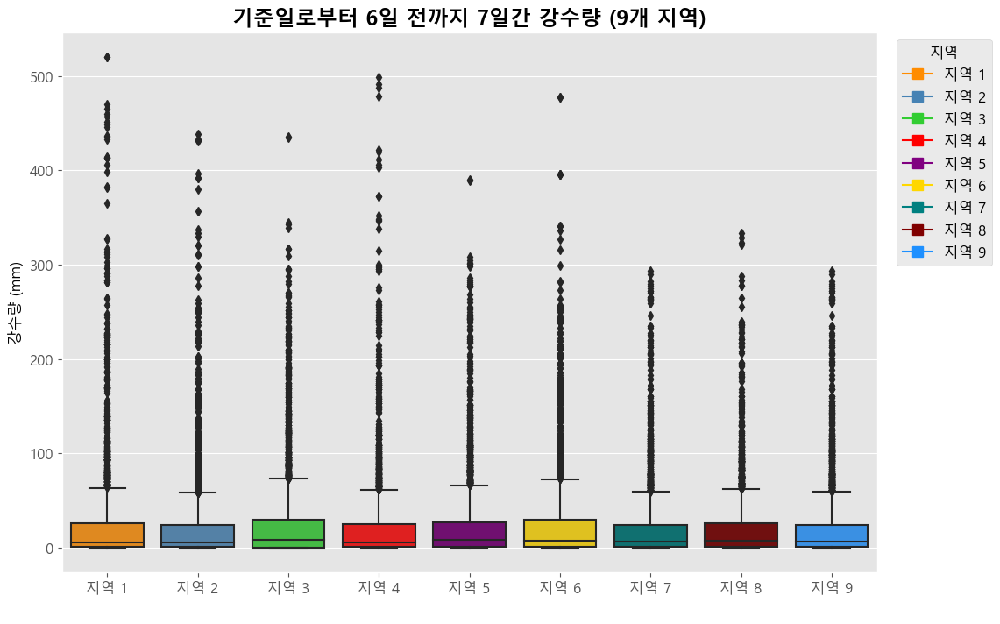

In [45]:
# 기준일로부터 6일 전까지 7일간 강수량 (9개 지역)

rainfall_data = [
    data_1["sumRn7"],
    data_2["sumRn7"],
    data_3["sumRn7"],
    data_4["sumRn7"],
    data_5["sumRn7"],
    data_6["sumRn7"],
    data_7["sumRn7"],
    data_8["sumRn7"],
    data_9["sumRn7"],
]

regions = ["지역 {}".format(i+1) for i in range(len(rainfall_data))]

data_frame = []
for i, region_data in enumerate(rainfall_data):
    for days in region_data:
        data_frame.append({" ": regions[i], "7일간 강수량": days})

df = pd.DataFrame(data_frame)

colors = ['darkorange', 'steelblue', 'limegreen', 'red', 'purple', 'gold', 'teal', 'maroon', 'dodgerblue']

# 박스플롯 생성
sns.boxplot(x=" ", y="7일간 강수량", data=df, palette=colors)

plt.title("기준일로부터 6일 전까지 7일간 강수량 (9개 지역)", fontweight="bold")
plt.ylabel("강수량 (mm)")

# 범례 추가
legend_labels = [plt.Line2D([0], [0], marker='s', color=color, markersize=8, markerfacecolor=color) for color in colors]
plt.legend(legend_labels, regions, title="지역", loc='upper right', bbox_to_anchor=(1.15, 1))

plt.show()

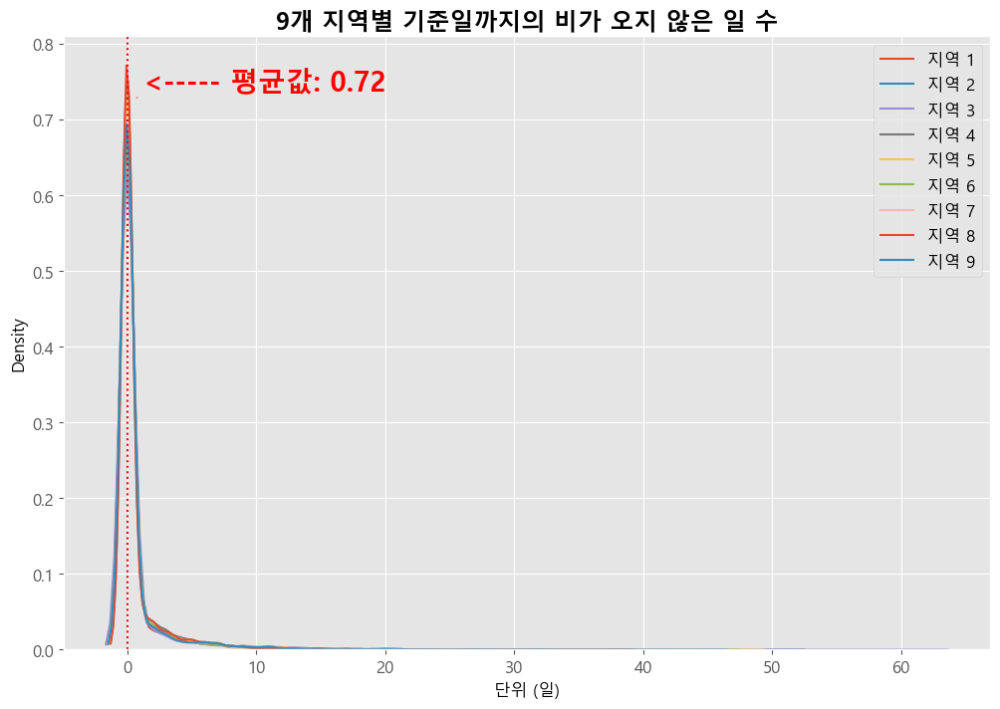

In [46]:
# 9개 지역별 기준일까지의 비가 오지 않은 일 수

rainfall_data = [
    data_1["noRn"],
    data_2["noRn"],
    data_3["noRn"],
    data_4["noRn"],
    data_5["noRn"],
    data_6["noRn"],
    data_7["noRn"],
    data_8["noRn"],
    data_9["noRn"],
]

regions = ["지역 {}".format(i+1) for i in range(len(rainfall_data))]

fig, ax = plt.subplots()
for i in range(len(rainfall_data)):
    sns.kdeplot(rainfall_data[i], ax=ax, label=regions[i])

ax.axvline(x=0, color='red', linestyle='dotted')


mean_value = sum(rainfall_data[0]) / len(rainfall_data[0])
ax.annotate(f"<----- 평균값: {mean_value:.2f}", xy=(mean_value, 0.9), xycoords=('data', 'axes fraction'),
            xytext=(5, 5), textcoords='offset points', color='red', weight='bold', fontsize = "20",
            arrowprops=dict(arrowstyle='-', color='red'))

ax.set_title("9개 지역별 기준일까지의 비가 오지 않은 일 수", fontweight="bold")
ax.set_xlabel("단위 (일)")

plt.legend()

plt.show()

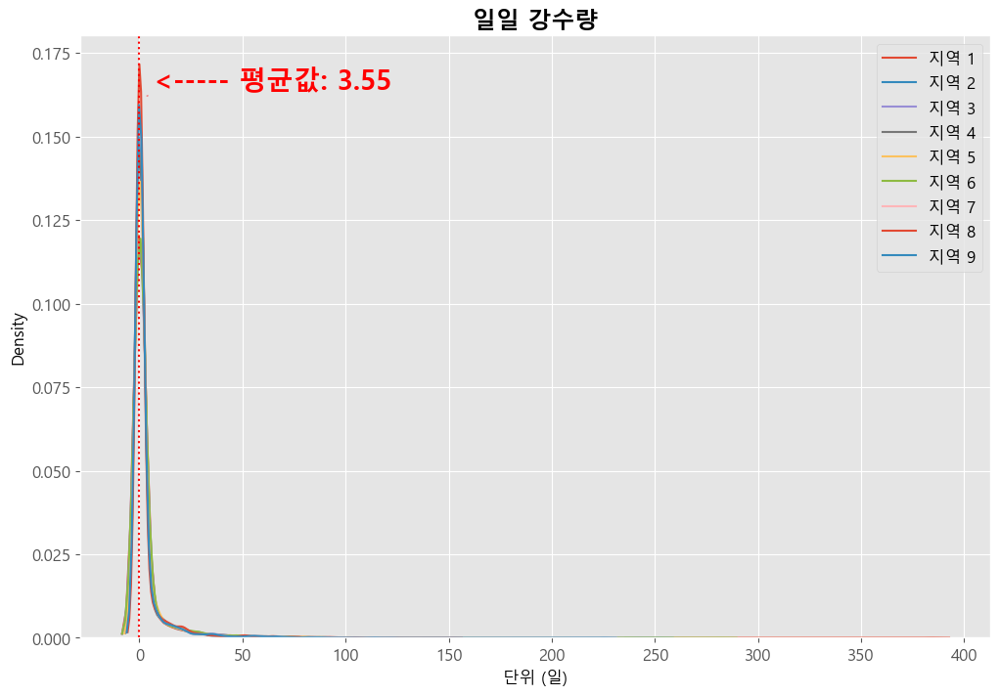

In [47]:
# 9개 지역별 일일 강수량

rainfall_data = [
    data_1["sumRn"],
    data_2["sumRn"],
    data_3["sumRn"],
    data_4["sumRn"],
    data_5["sumRn"],
    data_6["sumRn"],
    data_7["sumRn"],
    data_8["sumRn"],
    data_9["sumRn"],
]

regions = ["지역 {}".format(i+1) for i in range(len(rainfall_data))]

fig, ax = plt.subplots()
for i in range(len(rainfall_data)):
    sns.kdeplot(rainfall_data[i], ax=ax, label=regions[i])

ax.axvline(x=0, color='red', linestyle='dotted')

mean_value = sum(rainfall_data[0]) / len(rainfall_data[0])
ax.annotate(f"<----- 평균값: {mean_value:.2f}", xy=(mean_value, 0.9), xycoords=('data', 'axes fraction'),
            xytext=(5, 5), textcoords='offset points', color='red', weight='bold', fontsize = "20",
            arrowprops=dict(arrowstyle='-', color='red'))

ax.set_title("일일 강수량", fontweight="bold")
ax.set_xlabel("단위 (일)")

plt.legend()

plt.show()